# Diffusion Models

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy.stats import kstest
from IPython.display import HTML

# === Parameters ===
np.random.seed(42)
n_samples = 10000     # Number of data points
T = 200               # Number of diffusion steps
beta_start = 1e-4     # Starting noise level
beta_end = 0.1        # Ending noise level

# === Initial Data: piecewise uniform with gaps ===
n1 = n_samples // 3
n2 = n_samples // 3
n3 = n_samples - n1 - n2
initial_data = np.concatenate([
    np.random.uniform(-10, -6, size=n1),
    np.random.uniform(-2,  2, size=n2),
    np.random.uniform( 6, 10, size=n3),
])

# === Noise schedule ===
beta = np.linspace(beta_start, beta_end, T)
alpha = 1.0 - beta
bar_alpha = np.cumprod(alpha)

# === Precompute forward diffusion steps ===
diffusion_steps = [initial_data.copy()]
for t in range(T):
    x_prev = diffusion_steps[-1]
    noise = np.random.randn(n_samples)
    x_next = np.sqrt(alpha[t]) * x_prev + np.sqrt(beta[t]) * noise
    diffusion_steps.append(x_next)

# === Test normality at each step (KS test) ===
normality_p = []
for data in diffusion_steps:
    m, s = data.mean(), data.std()
    _, pvalue = kstest(data, 'norm', args=(m, s))
    normality_p.append(pvalue)

# === Set up histogram bins & Gaussian PDF ===
bins = np.linspace(-12, 12, 60)
bin_centers = 0.5 * (bins[:-1] + bins[1:])
x_grid = np.linspace(-12, 12, 500)
gauss_pdf = np.exp(-0.5 * x_grid**2) / np.sqrt(2 * np.pi)

# === Create figure & initial plot ===
fig, ax = plt.subplots(figsize=(8, 5))
ax.set_xlim(-12, 12)
ax.set_ylim(0, 0.45)
ax.set_xlabel("Value")
ax.set_ylabel("Density")
ax.grid(True)

# initial histogram
hist_vals, _ = np.histogram(initial_data, bins=bins, density=True)
bars = ax.bar(bin_centers, hist_vals, width=bins[1]-bins[0], alpha=0.6, color='orange')

# overlay final Gaussian curve
line_pdf, = ax.plot(x_grid, gauss_pdf, 'r--', lw=2, label='Standard Gaussian')
ax.legend(loc='upper right')

# equation text (constant)
equation_text = ax.text(
    0.5, 1.08,
    r"$x_t = \sqrt{1-\beta_t}\,x_{t-1} + \sqrt{\beta_t}\,\epsilon,\quad \epsilon\sim\mathcal{N}(0,I)$",
    transform=ax.transAxes, ha="center", va="bottom", fontsize=12
)

# subtitle text (updates each frame)
subtitle_text = ax.text(
    0.5, 1.02,
    "", transform=ax.transAxes, ha="center", va="bottom", fontsize=10
)

# === Animation update function ===
def update(frame):
    data = diffusion_steps[frame]
    hist_vals, _ = np.histogram(data, bins=bins, density=True)
    for bar, h in zip(bars, hist_vals):
        bar.set_height(h)
    pval = normality_p[frame]
    subtitle_text.set_text(f"Step {frame}/{T}  |  KS p-value = {pval:.3f}; close to 1 → Gaussian; close to 0 → Not Gaussian")
    return (*bars, subtitle_text)

# === Create Animation ===
ani = FuncAnimation(
    fig, update,
    frames=len(diffusion_steps),
    interval=50,
    blit=True
)

# prevent static plot from showing
plt.close(fig)

# Display in Jupyter
HTML(ani.to_jshtml())

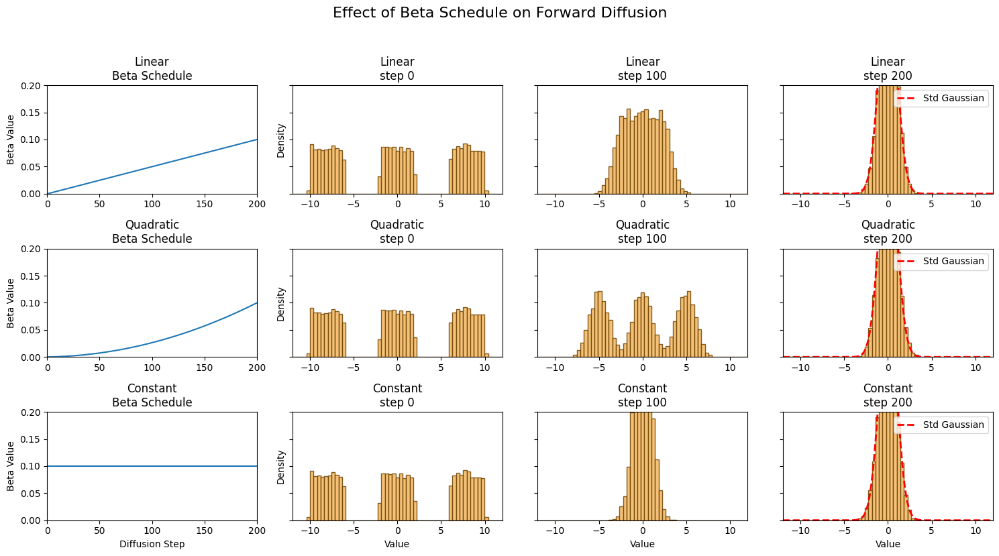

In [9]:
import numpy as np
import matplotlib.pyplot as plt

# === Parameters ===
np.random.seed(42)
n_samples = 10000     # Number of data points
T = 200               # Number of diffusion steps
beta_start = 1e-4     # Starting noise level
beta_end = 0.1        # Ending noise level

# === Initial Data: piecewise uniform with gaps ===
n1 = n_samples // 3
n2 = n_samples // 3
n3 = n_samples - n1 - n2
initial_data = np.concatenate([
    np.random.uniform(-10, -6, size=n1),
    np.random.uniform(-2,  2, size=n2),
    np.random.uniform( 6, 10, size=n3),
])

# === Define Beta Schedules ===
schedules = {
    'Linear':    np.linspace(beta_start, beta_end, T),
    'Quadratic': np.linspace(np.sqrt(beta_start), np.sqrt(beta_end), T)**2,
    'Constant':  np.full(T, beta_end)
}

# === Timesteps to visualize ===
timesteps = [0, T//2, T]  # start, mid, end

# === Histogram bins ===
bins = np.linspace(-12, 12, 60)

# === Standard normal PDF for overlay ===
x_grid = np.linspace(-12, 12, 500)
gauss_pdf = np.exp(-0.5 * x_grid**2) / np.sqrt(2 * np.pi)

# === Colors matching the screenshot style ===
bar_color = "#F3B762"
edge_color = "#6D4301"
gauss_color = "r"

# === Create subplots: add extra col for beta curves ===
fig, axes = plt.subplots(
    nrows=len(schedules),
    ncols=len(timesteps) + 1,
    figsize=(15, 8),
    sharey=True
)

# === Plot Beta schedules column (leftmost) ===
for i, (name, beta) in enumerate(schedules.items()):
    ax = axes[i, 0]
    ax.plot(range(1, T+1), beta, color="C0")
    ax.set_xlim(0, T)
    ax.set_title(f"{name}\nBeta Schedule")
    if i == len(schedules)-1:
        ax.set_xlabel("Diffusion Step")
    ax.set_ylabel("Beta Value")

# === Plot histograms for each schedule/timestep ===
for i, (name, beta) in enumerate(schedules.items()):
    # Simulate forward diffusion for this beta schedule
    diffusion = [initial_data.copy()]
    for t in range(T):
        x_prev = diffusion[-1]
        noise = np.random.randn(n_samples)
        x_next = np.sqrt(1 - beta[t]) * x_prev + np.sqrt(beta[t]) * noise
        diffusion.append(x_next)

    for j, t in enumerate(timesteps):
        ax = axes[i, j+1]   # +1 to account for leftmost beta plot
        data = diffusion[t]
        # Histogram (not line plot)
        hist = ax.hist(data, bins=bins, density=True, 
                       color=bar_color, edgecolor=edge_color, alpha=0.85)
        # At final timestep overlay Gaussian
        if t == T:
            ax.plot(x_grid, gauss_pdf, gauss_color+"--", lw=2, label="Std Gaussian")
            ax.legend()
        ax.set_xlim(-12, 12)
        ax.set_title(f"{name}\nstep {t}")
        if j == 0:
            ax.set_ylabel("Density")
        if i == len(schedules)-1:
            ax.set_xlabel("Value")
        # Only set ylim for the very first histogram (top-left only)
        if i == 0 and j == 0:
            ax.set_ylim(0, 0.2)

plt.suptitle("Effect of Beta Schedule on Forward Diffusion", y=1.03, fontsize=16)
plt.tight_layout()
plt.show()


Here are 15 multiple‐choice questions covering the material, each with four options and the correct answer indicated.

1. **Which of the following is the definition of the expectation of a function $f(x)$ under distribution $p(x)$?**
   A. $\displaystyle \int p(x)\,dx$
   B. $\displaystyle \int x\,p(x)\,dx$
   C. $\displaystyle \int f(x)\,p(x)\,dx$
   D. $\displaystyle \sum_x f(x)$
   **Answer:** C

2. **Jensen’s inequality states that for a convex function $f$ and random variable $X$:**
   A. $f(\mathbb{E}[X]) \ge \mathbb{E}[f(X)]$
   B. $f(\mathbb{E}[X]) \le \mathbb{E}[f(X)]$
   C. $\mathbb{E}[X] = f(\mathbb{E}[X])$
   D. $\mathbb{E}[f(X)] = f(\mathbb{E}[X])$
   **Answer:** B

3. **Which property does KL divergence $D_{KL}(q\|p)$ satisfy?**
   A. $D_{KL}(q\|p) < 0$ for all $q,p$
   B. $D_{KL}(q\|p)$ is symmetric in $q$ and $p$
   C. $D_{KL}(q\|p) \ge 0$ with equality only if $q=p$
   D. $D_{KL}(q\|p) = 1$ when $q=p$
   **Answer:** C

4. **The ELBO for a VAE decomposes $\log p(x)$ into:**
   A. $\mathbb{E}_{q}[\log p(x,z)] + D_{KL}(q\|p)$
   B. $\mathbb{E}_{q}[\log p(x|z)] - D_{KL}(q(z|x)\|p(z))$
   C. $D_{KL}(q\|p) - \mathbb{E}_{q}[\log p(x|z)]$
   D. $\mathbb{E}_{p}[\log q(z|x)] + D_{KL}(p\|q)$
   **Answer:** B

5. **In a diffusion model, $x_0$ refers to:**
   A. The fully noised sample after $T$ steps
   B. The original data sample before any noise
   C. The mean of the prior Gaussian
   D. A latent variable unrelated to the data
   **Answer:** B

6. **The forward transition $q(x_t\mid x_{t-1})$ is defined as:**
   A. $\mathcal{N}(x_t; x_{t-1}, 1)$
   B. $\mathcal{N}(x_t; \sqrt{1-\beta_t}x_{t-1},\,\beta_t I)$
   C. $\mathcal{N}(x_t;0, I)$
   D. A delta (no noise) distribution
   **Answer:** B

7. **The closed-form marginal $q(x_t \mid x_0)$ is:**
   A. $\mathcal{N}(x_t;\,0, I)$
   B. $\mathcal{N}(x_t;\,x_0,0)$
   C. $\mathcal{N}(x_t;\sqrt{\bar\alpha_t}x_0,\,(1-\bar\alpha_t)I)$
   D. $\prod_{s=1}^t q(x_s|x_{s-1})$
   **Answer:** C

8. **In the reverse process $p_\theta(x_{t-1}\mid x_t)$, the mean $\mu_\theta$ is:**
   A. Fixed to zero
   B. Learned by a neural network
   C. Equal to $\sqrt{1-\beta_t}\,x_t$
   D. Always $\bar\alpha_t x_t$
   **Answer:** B

9. **The variational bound (ELBO) for diffusion models involves which terms?**
   A. Only a reconstruction term
   B. Reconstruction + prior matching + denoising matching terms
   C. Only KL between $q(x_T|x_0)$ and $p(x_T)$
   D. Only the sum of Gaussian noise variances
   **Answer:** B

10. **The “simple” training loss in DDPMs predicts:**
    A. The data $x_0$ directly
    B. The noise $\epsilon$ added at each step
    C. The variance $\beta_t$ schedule
    D. The KL divergence exactly
    **Answer:** B

11. **Why predict $\epsilon$ instead of $x_0$ in practice?**
    A. $\epsilon$ is always zero
    B. $\epsilon$ is $\mathcal{N}(0,I)$, well-conditioned for regression
    C. Predicting $x_0$ is impossible
    D. It speeds up sampling but not training
    **Answer:** B

12. **The sampling update at inference uses:**
    A. Only the forward transition equation
    B. The reverse mean plus random Gaussian noise
    C. Deterministic gradient descent
    D. Direct inversion of the forward process
    **Answer:** B

13. **The product $\bar\alpha_t = \prod_{s=1}^t (1-\beta_s)$ controls:**
    A. Step size of the optimizer
    B. Cumulative signal preservation vs. noise
    C. The learning rate schedule
    D. The width of the Gaussian PDF
    **Answer:** B

14. **A linear vs. quadratic $\beta$-schedule primarily affects:**
    A. The shape of the learned neural network
    B. The speed at which $x_0$ is destroyed by noise
    C. The dimension of $x_t$
    D. The number of diffusion steps $T$
    **Answer:** B

15. **In the KS test for normality, a p-value close to 1 means:**
    A. Strong evidence that data deviates from Gaussian
    B. The data is very likely Gaussian
    C. Test failed to run
    D. Distribution is uniform
    **Answer:** B
